# Tutorial 5: Slide-seqV2 mouse hippocampus with 14 clusters

This tutorial demonstrates how to identify spatial domains on Slide-seqV2 mouse hippocampus data with 14 clusters for comparison.

In this tutorial, we foucs on the special section of Slide-seqV2 mouse hippocampus data (Puck_200115_08 from https://singlecell.broadinstitute.org/single_cell/study/SCP815/highly-sensitive-spatial-transcriptomics-at-near-cellular-resolution-with-slide-seqv2#study-summary).

We removed spots outside the main tissue area, and the used data (h5ad format) can be downloaded from https://zenodo.org/record/8141084.

## Loading package

In [1]:
import os
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from STGMVA.STGMVA import STGMMVE
from STGMVA import mk_dir

2023-07-15 11:54:06.214483: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Loading ST data

In [3]:
adata = sc.read("/home/tengliu/Paper6-NC/STGMVA_Tutorials/ST data/mouse_hippo.h5ad") # read data

In [4]:
adata

AnnData object with n_obs × n_vars = 20893 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution_results', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

## Create directory for pretrained model

In [5]:
save_path='./results_save/'
section_id = 'mouse_hippo_14'
mk_dir(save_path,section_id)

## Training the model

STGMVA aims to learn the representations by two-step process. First, pretrained the GMM clustering model. Second, discerned the spatial domains for spatial transcriptomics data. 

After model training, the learned representations will be saved in adata.obsm['embedding'], and can be used for spatial clustering. 

In [6]:
model = STGMMVE(adata, datatype = "Slide", nCluster=14, save_path=save_path, section_id=section_id)

model.pretrain() # Train your own pretranined model or use the pretrained model we provided.

adata_res = model.train_cluster()


Graph constructed!


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 5.4.10
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


  0%|          | 0/50 [01:38<?, ?it/s]

Epoch: 0
NMI=0.502775, ARI=0.342569
Loss=148.4293,  ELBO Loss=178.2637


 10%|█         | 5/50 [08:06<1:00:15, 80.35s/it] 

Epoch: 5
NMI=0.594373, ARI=0.492992
Loss=139.9669,  ELBO Loss=166.7792


 20%|██        | 10/50 [14:50<52:16, 78.41s/it] 

Epoch: 10
NMI=0.554414, ARI=0.409371
Loss=132.1419,  ELBO Loss=156.3054


 30%|███       | 15/50 [21:29<49:09, 84.27s/it]

Epoch: 15
NMI=0.611667, ARI=0.509769
Loss=128.7983,  ELBO Loss=151.0322


 40%|████      | 20/50 [30:46<50:41, 101.40s/it]

Epoch: 20
NMI=0.616599, ARI=0.503699
Loss=125.6450,  ELBO Loss=146.0416


 50%|█████     | 25/50 [38:33<43:16, 103.84s/it]

Epoch: 25
NMI=0.598231, ARI=0.520445
Loss=121.9014,  ELBO Loss=140.8571


 60%|██████    | 30/50 [46:43<30:06, 90.30s/it] 

Epoch: 30
NMI=0.636793, ARI=0.517180
Loss=119.0047,  ELBO Loss=136.6566


 70%|███████   | 35/50 [55:29<25:00, 100.00s/it]

Epoch: 35
NMI=0.641167, ARI=0.524595
Loss=116.6684,  ELBO Loss=133.3110


 80%|████████  | 40/50 [1:06:02<22:14, 133.43s/it]

Epoch: 40
NMI=0.639382, ARI=0.523579
Loss=113.9375,  ELBO Loss=129.6622


 90%|█████████ | 45/50 [1:17:20<12:11, 146.24s/it]

Epoch: 45
NMI=0.635213, ARI=0.521630
Loss=113.4361,  ELBO Loss=128.3369


100%|██████████| 50/50 [1:27:21<00:00, 104.82s/it]


In [7]:
adata_res

AnnData object with n_obs × n_vars = 20893 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster', 'pre_label'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'spatial_neighbors', 'umap', 'mclust_labels', 'ari_list', 'loss'
    obsm: 'X_pca', 'X_umap', 'deconvolution_results', 'spatial', 'graph_neigh', 'adj', 'feat_mat', 'embedding'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

## Visualization

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


(559.8679999999999, 5923.292, 530.2284999999999, 5835.3414999999995)

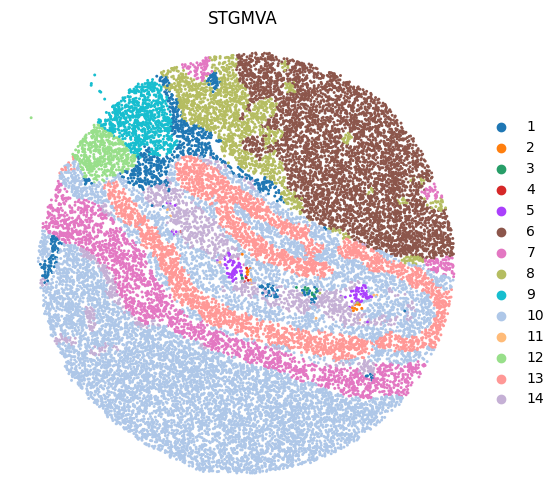

In [8]:
plt.rcParams["figure.figsize"] = (6, 6)
sc.pl.embedding(adata_res, basis="spatial", color="pre_label",s=18, show=False, title='STGMVA')
plt.axis('off')

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


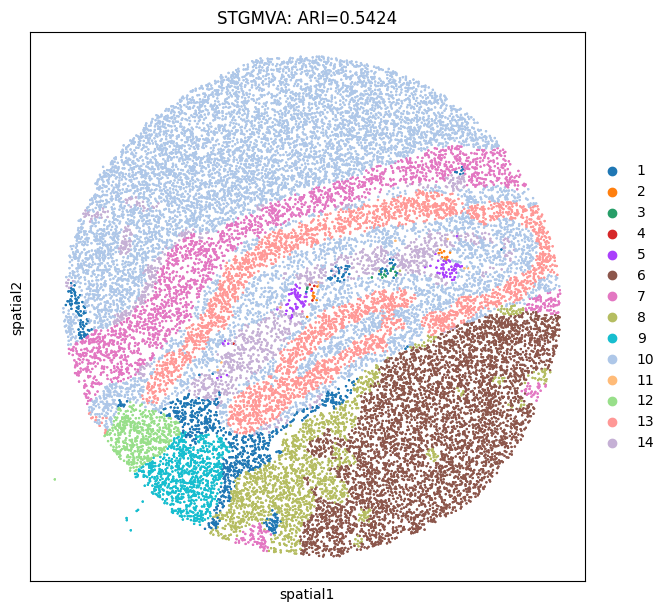

In [10]:
sq.pl.spatial_scatter(adata_res, color="pre_label", size=2, figsize=(8,6),
                      title=['STGMVA:' + ' ARI=%.4f'%np.max(adata_res.uns["ari_list"])],shape=None)

/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/tengliu/miniconda3/envs/Torch_pyG2.0/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'Predicted labels'}, xlabel='UMAP1', ylabel='UMAP2'>

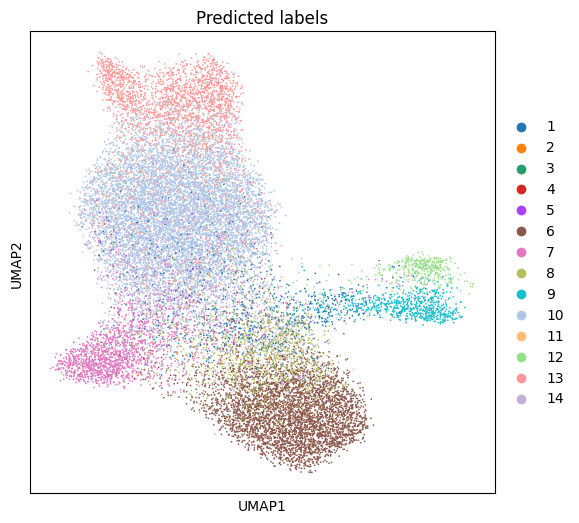

In [11]:
# plotting predicted labels by UMAP
sc.pp.neighbors(adata_res, use_rep='embedding', n_neighbors=10)
sc.tl.umap(adata_res)
sc.pl.umap(adata_res, color='pre_label', title=['Predicted labels'], show=False)

## Save the results for more figures

In [12]:
adata_res.filename = './'+"mouse_hippocampus_14_clusters.h5ad"